In [1]:
!pip install -q git+https://github.com/allansdefreitas/yolov10.git
!pip install -q supervision

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 44.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 23.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 44.4 

In [2]:
!wget https://github.com/moured/YOLOv10-Document-Layout-Analysis/releases/download/doclaynet_weights/yolov10x_best.pt

--2025-09-15 14:32:46--  https://github.com/moured/YOLOv10-Document-Layout-Analysis/releases/download/doclaynet_weights/yolov10x_best.pt
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/809399250/e52eefec-ac07-4944-997c-59e48e23474b?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-09-15T15%3A30%3A14Z&rscd=attachment%3B+filename%3Dyolov10x_best.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-09-15T14%3A30%3A12Z&ske=2025-09-15T15%3A30%3A14Z&sks=b&skv=2018-11-09&sig=nmGQjiph5yOBJ%2FxfmmYM7KgO3TzRIxbO8lAzrVkHG%2FQ%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc1Nzk0NzA2NiwibmJmIjoxNzU3OTQ2NzY2LCJwYXR

In [3]:
import os 
import matplotlib.pyplot as plt
import cv2

In [4]:
gt_dir = '/kaggle/input/dir300/DIR300 FULL/gt'
dist_dir = '/kaggle/input/dir300/DIR300 FULL/dist'
dewarped_dir = '/kaggle/input/dewarping-benchmarks-artifacts/dir300-dewarping_results/dewarping_results-dir300'

assert os.path.exists(gt_dir)
assert os.path.exists(dist_dir)
assert os.path.exists(dewarped_dir)

# Dewarping quality

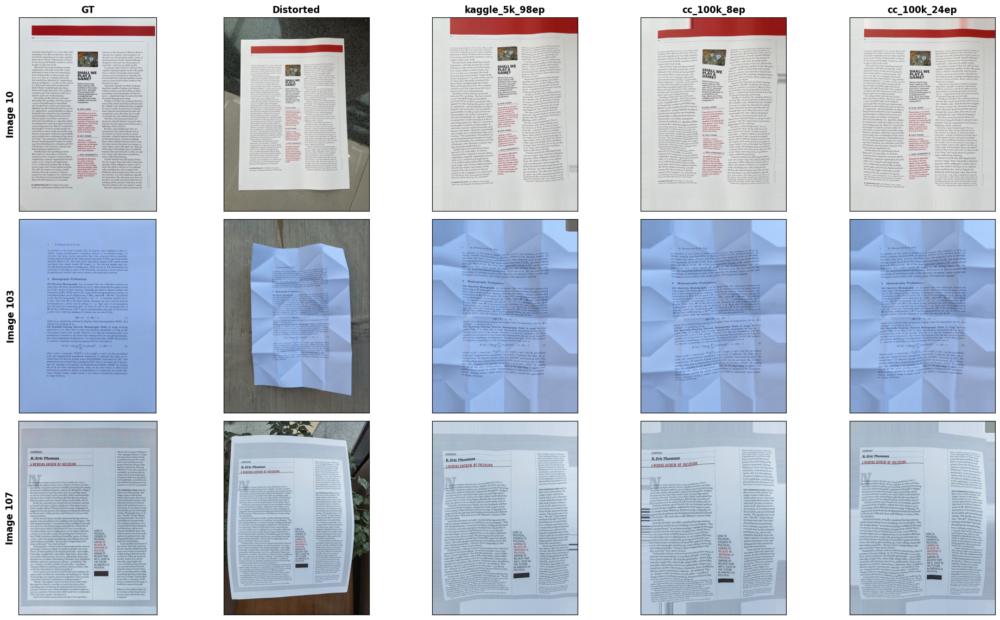

In [6]:
# Define the image numbers and model names
image_numbers = [10, 12, 103]
model_names = ['kaggle_5k_98ep', 'cc_100k_8ep', 'cc_100k_24ep']

# Create the plot
fig, axes = plt.subplots(len(image_numbers), len(model_names) + 2, figsize=(20, 12))
# fig.suptitle('Image Comparison: GT vs Distorted vs Dewarped', fontsize=16, fontweight='bold')

# If we have only one row, make sure axes is 2D
if len(image_numbers) == 1:
    axes = axes.reshape(1, -1)

# Set column titles
col_titles = ['GT', 'Distorted'] + [f'{model}' for model in model_names]
for ax, col_title in zip(axes[0], col_titles):
    ax.set_title(col_title, fontsize=12, fontweight='bold')

# Process each image
for row_idx, img_num in enumerate(image_numbers):
    # Load GT image
    gt_path = os.path.join(gt_dir, f"{img_num}.png")
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    
    # Load distorted image
    dist_path = os.path.join(dist_dir, f"{img_num}.png")
    dist_img = cv2.imread(dist_path)
    dist_img = cv2.cvtColor(dist_img, cv2.COLOR_BGR2RGB)
    
    # Display GT and distorted images
    axes[row_idx, 0].imshow(gt_img)
    axes[row_idx, 0].set_ylabel(f'Image {img_num}', fontsize=12, fontweight='bold')
    axes[row_idx, 0].set_xticks([])
    axes[row_idx, 0].set_yticks([])
    
    axes[row_idx, 1].imshow(dist_img)
    axes[row_idx, 1].set_xticks([])
    axes[row_idx, 1].set_yticks([])
    
    # Display dewarped images for each model
    for col_idx, model in enumerate(model_names):
        dewarped_path = os.path.join(dewarped_dir, f"{img_num}-{model}.png")
        if os.path.exists(dewarped_path):
            dewarped_img = cv2.imread(dewarped_path)
            dewarped_img = cv2.cvtColor(dewarped_img, cv2.COLOR_BGR2RGB)
            axes[row_idx, col_idx + 2].imshow(dewarped_img)
        else:
            axes[row_idx, col_idx + 2].text(0.5, 0.5, 'Not Found', 
                                           horizontalalignment='center',
                                           verticalalignment='center',
                                           transform=axes[row_idx, col_idx + 2].transAxes,
                                           fontsize=12)
            axes[row_idx, col_idx + 2].set_facecolor('lightgray')
        
        axes[row_idx, col_idx + 2].set_xticks([])
        axes[row_idx, col_idx + 2].set_yticks([])

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

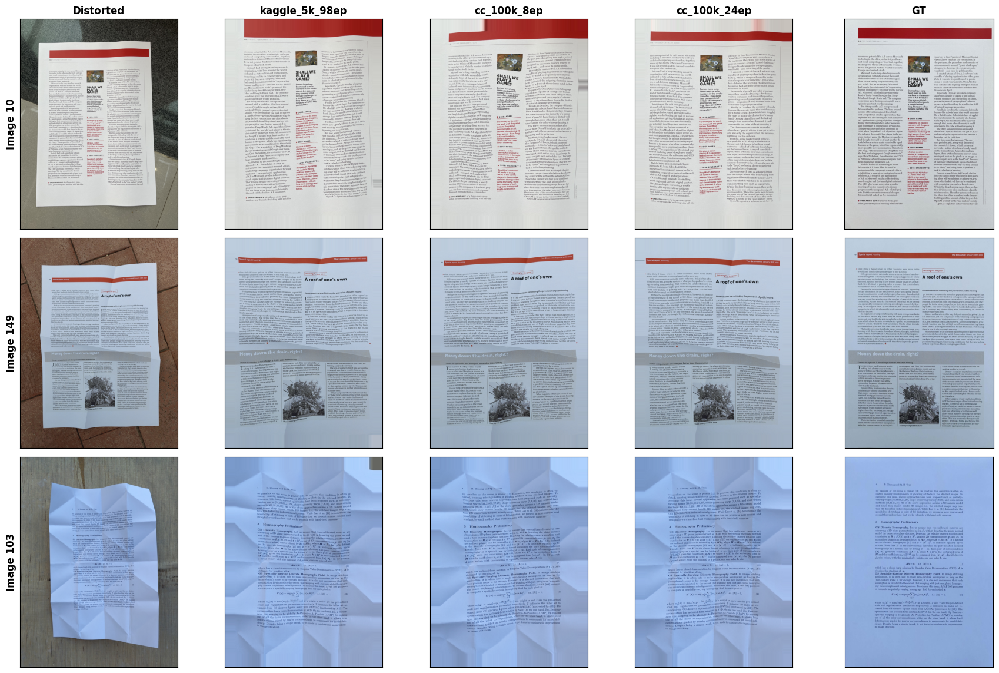

In [6]:
image_numbers = [10, 149, 103]
model_names = ['kaggle_5k_98ep', 'cc_100k_8ep', 'cc_100k_24ep']

# Create the plot - now we have 5 columns: Distorted + 3 Dewarped + GT
fig, axes = plt.subplots(len(image_numbers), len(model_names) + 2, figsize=(18, 12))

# If we have only one row, make sure axes is 2D
if len(image_numbers) == 1:
    axes = axes.reshape(1, -1)

# Set column titles in the new order: Distorted, Dewarped models, GT
col_titles = ['Distorted'] + [f'{model}' for model in model_names] + ['GT']
for ax, col_title in zip(axes[0], col_titles):
    ax.set_title(col_title, fontsize=12, fontweight='bold')

# Process each image
for row_idx, img_num in enumerate(image_numbers):
    # Load GT image
    gt_path = os.path.join(gt_dir, f"{img_num}.png")
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    
    # Load distorted image
    dist_path = os.path.join(dist_dir, f"{img_num}.png")
    dist_img = cv2.imread(dist_path)
    dist_img = cv2.cvtColor(dist_img, cv2.COLOR_BGR2RGB)
    
    # Display distorted image in first column
    axes[row_idx, 0].imshow(dist_img)
    axes[row_idx, 0].set_ylabel(f'Image {img_num}', fontsize=12, fontweight='bold')
    axes[row_idx, 0].set_xticks([])
    axes[row_idx, 0].set_yticks([])
    
    # Display dewarped images for each model (columns 1-3)
    for col_idx, model in enumerate(model_names):
        dewarped_path = os.path.join(dewarped_dir, f"{img_num}-{model}.png")
        if os.path.exists(dewarped_path):
            dewarped_img = cv2.imread(dewarped_path)
            dewarped_img = cv2.cvtColor(dewarped_img, cv2.COLOR_BGR2RGB)
            axes[row_idx, col_idx + 1].imshow(dewarped_img)
        else:
            axes[row_idx, col_idx + 1].text(0.5, 0.5, 'Not Found', 
                                           horizontalalignment='center',
                                           verticalalignment='center',
                                           transform=axes[row_idx, col_idx + 1].transAxes,
                                           fontsize=12)
            axes[row_idx, col_idx + 1].set_facecolor('lightgray')
        
        axes[row_idx, col_idx + 1].set_xticks([])
        axes[row_idx, col_idx + 1].set_yticks([])
    
    # Display GT image in the last column
    axes[row_idx, len(model_names) + 1].imshow(gt_img)
    axes[row_idx, len(model_names) + 1].set_xticks([])
    axes[row_idx, len(model_names) + 1].set_yticks([])

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.savefig("dewarping_comparison-dir300.png")
plt.show()

# Influence of dewarping on layout analysis results

In [19]:
import supervision as sv
from ultralytics import YOLOv10


doc_layout_model = YOLOv10('yolov10x_best.pt')

def detect_img_layout(path, verbose=False, save_path=None):
    """
    names: {0: 'Caption', 1: 'Footnote', 2: 'Formula', 3: 'List-item', 4: 'Page-footer', 5: 'Page-header', 
            6: 'Picture', 7: 'Section-header', 8: 'Table', 9: 'Text', 10: 'Title'}
    """
    image = cv2.imread(path)
    results = doc_layout_model(source=path, conf=0.2, iou=0.8)[0]
    detections = sv.Detections.from_ultralytics(results)

    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    
    annotated_image = bounding_box_annotator.annotate(
        scene=image, detections=detections)
    annotated_image = label_annotator.annotate(
        scene=annotated_image, detections=detections)

    if verbose == True:
        sv.plot_image(annotated_image)

    if save_path is not None:
        cv2.imwrite(save_path, annotated_image)
        print(f"Annotated image saved to: {save_path}")

    return detections


image 1/1 /kaggle/input/end-to-end-dewarping-model/1-cc_100k_24ep.png: 640x480 1 Caption, 2 Page-headers, 3 Section-headers, 4 Texts, 1492.6ms
Speed: 3.7ms preprocess, 1492.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


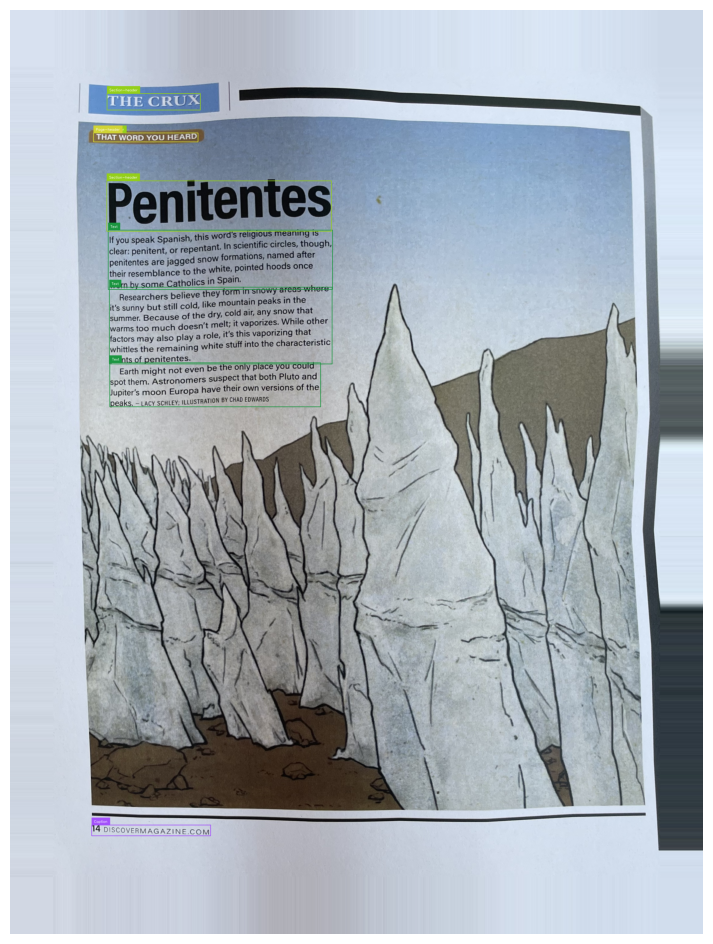

Annotated image saved to: 1_layout.png


Detections(xyxy=array([[     433.19,      1209.5,      1405.3,      1544.3],
       [     428.66,      960.07,      1407.6,      1219.4],
       [     435.92,      1539.3,      1355.1,      1731.7],
       [     422.21,      745.59,      1402.7,      965.42],
       [     423.76,      364.15,      830.97,      436.68],
       [     423.76,      364.15,      830.97,      436.68],
       [     356.49,      3556.9,       875.2,        3603],
       [     364.47,       536.6,       820.5,      575.29],
       [     364.47,       536.6,       820.5,      575.29],
       [     364.47,       536.6,       820.5,      575.29]], dtype=float32), mask=None, confidence=array([     0.9459,     0.93522,      0.9229,     0.84812,     0.36423,     0.35242,     0.32525,     0.30064,     0.24168,     0.21134], dtype=float32), class_id=array([9, 9, 9, 7, 5, 7, 0, 7, 9, 5]), tracker_id=None, data={'class_name': array(['Text', 'Text', 'Text', 'Section-header', 'Page-header', 'Section-header', 'Caption', 'Se

In [20]:
detect_img_layout('/kaggle/input/end-to-end-dewarping-model/1-cc_100k_24ep.png', True, '1_layout.png')


image 1/1 /kaggle/input/dir300/DIR300 FULL/gt/10.png: 640x480 2 Page-headers, 2 Pictures, 3 Section-headers, 17 Texts, 1525.2ms
Speed: 3.5ms preprocess, 1525.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/dir300/DIR300 FULL/dist/10.png: 640x480 1 Caption, 1 Page-header, 1 Picture, 2 Section-headers, 16 Texts, 1555.4ms
Speed: 3.6ms preprocess, 1555.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/dewarping-benchmarks-artifacts/dir300-dewarping_results/dewarping_results-dir300/10-kaggle_5k_98ep.png: 640x480 1 Caption, 1 Picture, 3 Section-headers, 17 Texts, 1485.3ms
Speed: 3.8ms preprocess, 1485.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/dewarping-benchmarks-artifacts/dir300-dewarping_results/dewarping_results-dir300/10-cc_100k_8ep.png: 640x480 1 Page-header, 3 Pictures, 3 Section-headers, 16 Texts, 1525.1ms
Speed: 3.6ms preprocess, 1525.1ms infe

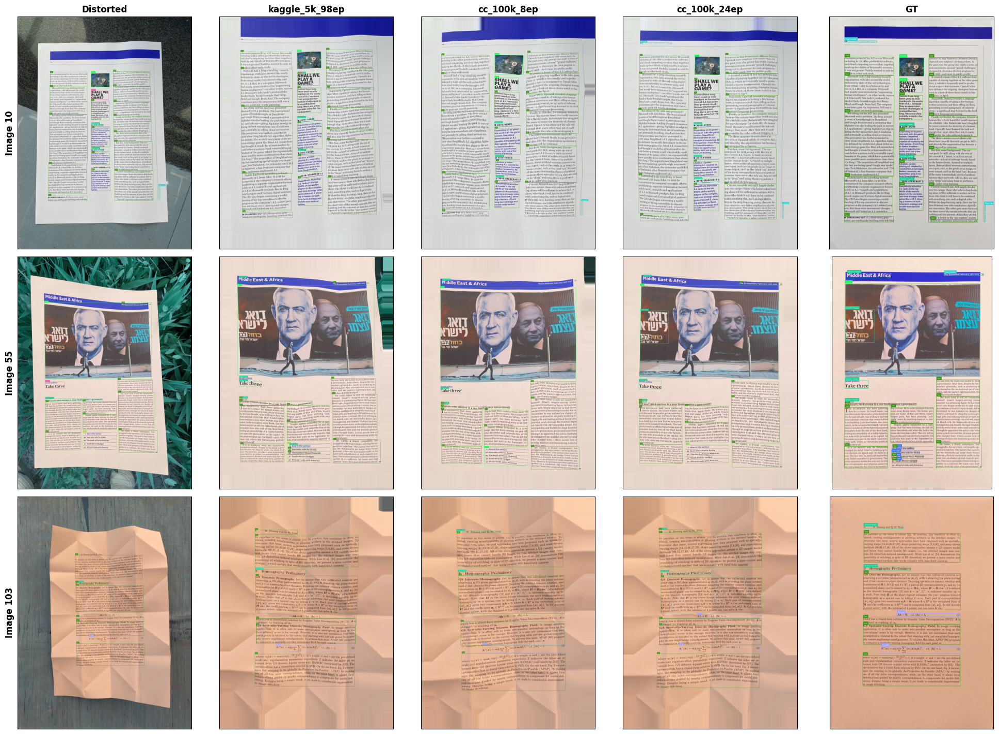

In [23]:
import os
import matplotlib.pyplot as plt
import cv2
import supervision as sv
from ultralytics import YOLOv10

# Initialize the document layout model
doc_layout_model = YOLOv10('yolov10x_best.pt')

def detect_img_layout(path, verbose=False, save_path=None):
    """
    Detect document layout in an image using YOLOv10 model.
    """
    image = cv2.imread(path)
    results = doc_layout_model(source=path, conf=0.2, iou=0.8)[0]
    detections = sv.Detections.from_ultralytics(results)

    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    
    annotated_image = bounding_box_annotator.annotate(
        scene=image, detections=detections)
    annotated_image = label_annotator.annotate(
        scene=annotated_image, detections=detections)

    # Create annotated image if verbose or save_path is provided
    if verbose or save_path is not None:
    
        # Display if verbose is True
        if verbose:
            sv.plot_image(annotated_image)
        
        # Save if save_path is provided
        if save_path is not None:
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            cv2.imwrite(save_path, annotated_image)
            print(f"Annotated image saved to: {save_path}")

    return annotated_image

# Define image numbers and model names
image_numbers = [10, 55, 103]
model_names = ['kaggle_5k_98ep', 'cc_100k_8ep', 'cc_100k_24ep']

# Create the plot - now we have 5 columns: Distorted + 3 Dewarped + GT
fig, axes = plt.subplots(len(image_numbers), len(model_names) + 2, figsize=(20, 15))

# If we have only one row, make sure axes is 2D
if len(image_numbers) == 1:
    axes = axes.reshape(1, -1)

# Set column titles in the new order: Distorted, Dewarped models, GT
col_titles = ['Distorted'] + [f'{model}' for model in model_names] + ['GT']
for ax, col_title in zip(axes[0], col_titles):
    ax.set_title(col_title, fontsize=12, fontweight='bold')

# Process each image
for row_idx, img_num in enumerate(image_numbers):
    # Load GT image and apply layout analysis
    gt_path = os.path.join(gt_dir, f"{img_num}.png")
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    gt_annotated = detect_img_layout(gt_path)  # Apply layout analysis
    
    # Load distorted image and apply layout analysis
    dist_path = os.path.join(dist_dir, f"{img_num}.png")
    dist_img = cv2.imread(dist_path)
    dist_img = cv2.cvtColor(dist_img, cv2.COLOR_BGR2RGB)
    dist_annotated = detect_img_layout(dist_path)  # Apply layout analysis
    
    # Display distorted image with layout analysis in first column
    axes[row_idx, 0].imshow(dist_annotated)
    axes[row_idx, 0].set_ylabel(f'Image {img_num}', fontsize=12, fontweight='bold')
    axes[row_idx, 0].set_xticks([])
    axes[row_idx, 0].set_yticks([])
    
    # Display dewarped images with layout analysis for each model (columns 1-3)
    for col_idx, model in enumerate(model_names):
        dewarped_path = os.path.join(dewarped_dir, f"{img_num}-{model}.png")
        if os.path.exists(dewarped_path):
            dewarped_img = cv2.imread(dewarped_path)
            dewarped_img = cv2.cvtColor(dewarped_img, cv2.COLOR_BGR2RGB)
            dewarped_annotated = detect_img_layout(dewarped_path)  # Apply layout analysis
            axes[row_idx, col_idx + 1].imshow(dewarped_annotated)
        else:
            axes[row_idx, col_idx + 1].text(0.5, 0.5, 'Not Found', 
                                           horizontalalignment='center',
                                           verticalalignment='center',
                                           transform=axes[row_idx, col_idx + 1].transAxes,
                                           fontsize=12)
            axes[row_idx, col_idx + 1].set_facecolor('lightgray')
        
        axes[row_idx, col_idx + 1].set_xticks([])
        axes[row_idx, col_idx + 1].set_yticks([])
    
    # Display GT image with layout analysis in the last column
    axes[row_idx, len(model_names) + 1].imshow(gt_annotated)
    axes[row_idx, len(model_names) + 1].set_xticks([])
    axes[row_idx, len(model_names) + 1].set_yticks([])

# Add a main title
# plt.suptitle('Document Layout Analysis Comparison: Distorted vs Dewarped vs GT', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.savefig("dewarping_comparison_with_layout-dir300.png", dpi=300, bbox_inches='tight')
plt.show()


image 1/1 /kaggle/input/dir300/DIR300 FULL/gt/1.png: 640x448 1 Page-footer, 2 Page-headers, 3 Section-headers, 3 Texts, 1311.6ms
Speed: 3.1ms preprocess, 1311.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 448)

image 1/1 /kaggle/input/dir300/DIR300 FULL/dist/1.png: 640x480 1 Caption, 1 Section-header, 2 Texts, 1474.4ms
Speed: 3.9ms preprocess, 1474.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/end-to-end-dewarping-model/1-kaggle_5k_98ep.png: 640x480 1 Section-header, 3 Texts, 1416.0ms
Speed: 3.6ms preprocess, 1416.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/end-to-end-dewarping-model/1-cc_100k_8ep.png: 640x480 1 Text, 1426.9ms
Speed: 4.2ms preprocess, 1426.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/end-to-end-dewarping-model/1-cc_100k_24ep.png: 640x480 1 Caption, 2 Page-headers, 3 Section-headers, 4 Texts, 1417.1ms
Speed

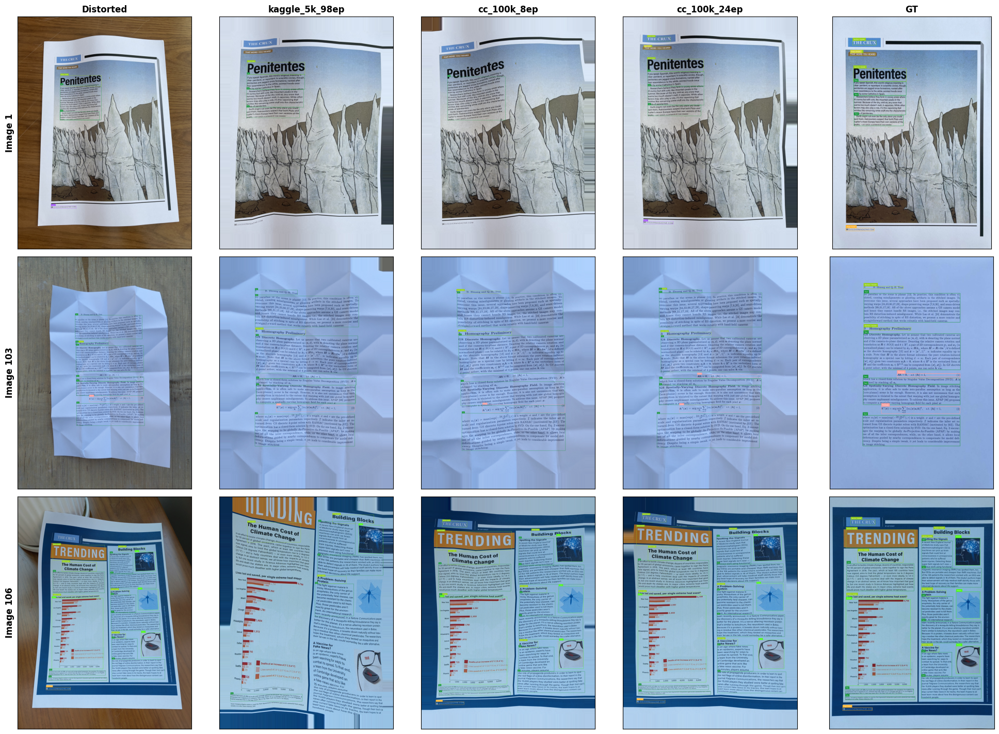

In [25]:
import os
import matplotlib.pyplot as plt
import cv2
import supervision as sv
from ultralytics import YOLOv10

# Initialize the document layout model
doc_layout_model = YOLOv10('yolov10x_best.pt')

def detect_img_layout(path, verbose=False, save_path=None):
    """
    Detect document layout in an image using YOLOv10 model.
    """
    image = cv2.imread(path)
    results = doc_layout_model(source=path, conf=0.2, iou=0.8)[0]
    detections = sv.Detections.from_ultralytics(results)

    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    
    annotated_image = bounding_box_annotator.annotate(
        scene=image, detections=detections)
    annotated_image = label_annotator.annotate(
        scene=annotated_image, detections=detections)

    # Create annotated image if verbose or save_path is provided
    if verbose or save_path is not None:
    
        # Display if verbose is True
        if verbose:
            sv.plot_image(annotated_image)
        
        # Save if save_path is provided
        if save_path is not None:
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            cv2.imwrite(save_path, annotated_image)
            print(f"Annotated image saved to: {save_path}")
            
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    return annotated_image_rgb

# Define image numbers and model names
image_numbers = [1, 103, 106]
model_names = ['kaggle_5k_98ep', 'cc_100k_8ep', 'cc_100k_24ep']

# Create the plot - now we have 5 columns: Distorted + 3 Dewarped + GT
fig, axes = plt.subplots(len(image_numbers), len(model_names) + 2, figsize=(20, 15))

# If we have only one row, make sure axes is 2D
if len(image_numbers) == 1:
    axes = axes.reshape(1, -1)

# Set column titles in the new order: Distorted, Dewarped models, GT
col_titles = ['Distorted'] + [f'{model}' for model in model_names] + ['GT']
for ax, col_title in zip(axes[0], col_titles):
    ax.set_title(col_title, fontsize=12, fontweight='bold')

# Process each image
for row_idx, img_num in enumerate(image_numbers):
    # Load GT image and apply layout analysis
    gt_path = os.path.join(gt_dir, f"{img_num}.png")
    gt_img = cv2.imread(gt_path)
    gt_img = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)
    gt_annotated = detect_img_layout(gt_path)  # Apply layout analysis
    
    # Load distorted image and apply layout analysis
    dist_path = os.path.join(dist_dir, f"{img_num}.png")
    dist_img = cv2.imread(dist_path)
    dist_img = cv2.cvtColor(dist_img, cv2.COLOR_BGR2RGB)
    dist_annotated = detect_img_layout(dist_path)  # Apply layout analysis
    
    # Display distorted image with layout analysis in first column
    axes[row_idx, 0].imshow(dist_annotated)
    axes[row_idx, 0].set_ylabel(f'Image {img_num}', fontsize=12, fontweight='bold')
    axes[row_idx, 0].set_xticks([])
    axes[row_idx, 0].set_yticks([])
    
    # Display dewarped images with layout analysis for each model (columns 1-3)
    for col_idx, model in enumerate(model_names):
        dewarped_path = os.path.join("/kaggle/input/end-to-end-dewarping-model", f"{img_num}-{model}.png")
        if os.path.exists(dewarped_path):
            dewarped_img = cv2.imread(dewarped_path)
            dewarped_img = cv2.cvtColor(dewarped_img, cv2.COLOR_BGR2RGB)
            dewarped_annotated = detect_img_layout(dewarped_path)  # Apply layout analysis
            axes[row_idx, col_idx + 1].imshow(dewarped_annotated)
        else:
            axes[row_idx, col_idx + 1].text(0.5, 0.5, 'Not Found', 
                                           horizontalalignment='center',
                                           verticalalignment='center',
                                           transform=axes[row_idx, col_idx + 1].transAxes,
                                           fontsize=12)
            axes[row_idx, col_idx + 1].set_facecolor('lightgray')
        
        axes[row_idx, col_idx + 1].set_xticks([])
        axes[row_idx, col_idx + 1].set_yticks([])
    
    # Display GT image with layout analysis in the last column
    axes[row_idx, len(model_names) + 1].imshow(gt_annotated)
    axes[row_idx, len(model_names) + 1].set_xticks([])
    axes[row_idx, len(model_names) + 1].set_yticks([])

# Add a main title
# plt.suptitle('Document Layout Analysis Comparison: Distorted vs Dewarped vs GT', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.savefig("dewarping_comparison_with_layout-dir300_v2.png", dpi=300, bbox_inches='tight')
plt.show()